In [1]:
import numpy as np
import pandas as pd
import operator as op

# Load the NPZ dataset
dataset = np.load('data/tlol/npz_short_data_0.npz')
dataset

NpzFile 'data/tlol/npz_short_data_0.npz' with keys: classes, centerpoints, timestamps, healths, gameIds...

In [2]:
import numpy as np

# Get the required data from the dataset
gameIds = dataset["gameIds"] # Note: this is a byte array, not a float
# Replace gameIds with a unique integer for each game
allGameIds = np.unique(dataset["gameIds"])
gameIdsAsInts = np.arange(len(allGameIds))
gameIdMap = dict(zip(allGameIds, gameIdsAsInts))
gameIds = np.array(list(map(lambda x: gameIdMap[x], gameIds)))
teamIds = dataset["teamIds"]
classes = dataset["classes"]
timestamps = np.round(dataset["timestamps"], 1).astype(np.float32)
centerpoints = dataset["centerpoints"]
healths = dataset["healths"]

# Form a matrix of the required data
data = np.column_stack((gameIds, teamIds, classes, timestamps, centerpoints, healths))

In [3]:

filtered_rows = data[(data[:, 0] == 0) & (data[:, 1] == 100)]
filtered_rows


array([[0.0000000e+00, 1.0000000e+02, 0.0000000e+00, ..., 6.1200000e+02,
        6.0400000e+02, 6.4500000e+02],
       [0.0000000e+00, 1.0000000e+02, 0.0000000e+00, ..., 6.1200000e+02,
        6.0400000e+02, 6.4500000e+02],
       [0.0000000e+00, 1.0000000e+02, 0.0000000e+00, ..., 6.1200000e+02,
        6.0400000e+02, 6.4500000e+02],
       ...,
       [0.0000000e+00, 1.0000000e+02, 4.0000000e+00, ..., 1.5504756e+03,
        1.1156224e+04, 6.5203610e+02],
       [0.0000000e+00, 1.0000000e+02, 4.0000000e+00, ..., 1.4719806e+03,
        1.1121208e+04, 6.5282570e+02],
       [0.0000000e+00, 1.0000000e+02, 4.0000000e+00, ..., 1.5504783e+03,
        1.1096238e+04, 6.5282570e+02]])

In [4]:
filters = [
    [
        [3, op.gt, 7.5],
        [0, op.eq, 0]
    ]
]

parse_filter = lambda filter, data_to_filter: filter[1](data_to_filter[:, filter[0]], filter[2])


def get_column_filters(data_to_filter, filters_to_use):
    return [[parse_filter(filter, data_to_filter) for filter in filter_group] for filter_group in filters_to_use]


def filter_with_rules(data_to_filter, rules):
    mask = np.any([np.all(column_filter_group, axis=0) for column_filter_group in rules], axis=0)
    return data_to_filter[mask]

print(get_column_filters(data, filters))

matching_rows = filter_with_rules(data, get_column_filters(data, filters))

matching_rows

[[array([False, False, False, ...,  True,  True,  True]), array([ True,  True,  True, ..., False, False, False])]]


array([[0.0000000e+00, 1.0000000e+02, 0.0000000e+00, ..., 6.1200000e+02,
        6.0400000e+02, 6.4500000e+02],
       [0.0000000e+00, 1.0000000e+02, 0.0000000e+00, ..., 6.1200000e+02,
        6.0400000e+02, 6.4500000e+02],
       [0.0000000e+00, 1.0000000e+02, 0.0000000e+00, ..., 6.1200000e+02,
        6.0400000e+02, 6.4500000e+02],
       ...,
       [0.0000000e+00, 2.0000000e+02, 9.0000000e+00, ..., 1.9186270e+03,
        1.2347886e+04, 6.2119660e+02],
       [0.0000000e+00, 2.0000000e+02, 9.0000000e+00, ..., 1.8403383e+03,
        1.2331019e+04, 6.2178620e+02],
       [0.0000000e+00, 2.0000000e+02, 9.0000000e+00, ..., 1.8403383e+03,
        1.2331019e+04, 6.2178620e+02]])

In [5]:
from collections import defaultdict

entries = defaultdict(list)
for game in gameIdsAsInts[:5]:
    gameRows = data[data[:, 0] == game]
    for timestamp in np.unique(gameRows[:, 3]):
        timestampRows = gameRows[gameRows[:, 3] == timestamp]
        team = 100 #200
        teamRows = timestampRows[timestampRows[:, 1] == team]
        enemyRows = timestampRows[timestampRows[:, 1] != team]
        entry = np.concatenate((teamRows[:, 4:6].flatten(), enemyRows[:, 4:6].flatten()))
        entries[game].append(entry)


entries.keys()

dict_keys([0, 1, 2, 3, 4])

In [6]:
df = pd.DataFrame(entries.values()).T
df

,0,1,2,3,4
0,"[612.0, 604.0, 436.0, 786.0, 136.0, 364.0, 402...","[402.0, 132.0, 612.0, 604.0, 286.0, 664.0, 398...","[402.0, 132.0, 286.0, 664.0, 612.0, 604.0, 136...","[402.0, 132.0, 612.0, 604.0, 286.0, 664.0, 136...","[286.0, 664.0, 564.053, 180.72182, 311.92914, ..."
1,"[612.0, 604.0, 436.0, 786.0, 277.79147, 522.26...","[402.0, 132.0, 612.0, 604.0, 286.0, 664.0, 471...","[402.0, 132.0, 448.0, 786.0, 612.0, 604.0, 136...","[402.0, 132.0, 468.0, 418.0, 286.0, 664.0, 136...","[286.0, 664.0, 708.0, 224.0, 511.1429, 444.269..."
2,"[612.0, 604.0, 401.88556, 646.6343, 344.98505,...","[402.0, 132.0, 612.0, 604.0, 286.0, 664.0, 580...","[402.0, 132.0, 448.0, 786.0, 612.0, 604.0, 136...","[402.0, 132.0, 468.0, 418.0, 286.0, 664.0, 136...","[286.0, 664.0, 708.0, 224.0, 439.00494, 471.73..."
3,"[612.0, 604.0, 431.2839, 641.8046, 510.4234, 7...","[402.0, 132.0, 612.0, 604.0, 286.0, 664.0, 580...","[402.0, 132.0, 448.0, 786.0, 612.0, 604.0, 273...","[402.0, 132.0, 420.0, 402.0, 286.0, 664.0, 136...","[286.0, 664.0, 708.0, 224.0, 375.7357, 385.763..."
4,"[612.0, 604.0, 420.449, 741.91693, 522.0, 772....","[402.0, 132.0, 612.0, 604.0, 286.0, 664.0, 580...","[402.0, 132.0, 448.0, 786.0, 612.0, 604.0, 343...","[402.0, 132.0, 332.0, 396.0, 286.0, 664.0, 136...","[286.0, 664.0, 708.0, 224.0, 505.51776, 390.24..."
...,...,...,...,...,...
605,"[13215.13, 3220.109, 7526.3213, 4916.0454, 738...",None,"[2882.0881, 12526.021, 5134.2617, 7343.9854, 1...",None,None
606,"[13215.13, 3220.109, 7509.483, 4832.654, 7352....",None,"[2932.2288, 12462.088, 5134.2617, 7343.9854, 1...",None,None
607,"[13264.32, 3288.4094, 7488.371, 4749.0273, 730...",None,"[2866.128, 12427.558, 5134.2617, 7343.9854, 10...",None,None
608,"[13317.334, 3351.6865, 7467.0474, 4666.7314, 7...",None,"[2790.1147, 12398.859, 5134.2617, 7343.9854, 1...",None,None


In [7]:
a_single_player_single_game = [ row[0:2] for row in df[0]]
all_players_all_games = [ row.tolist()[i:i+2] for j in range(5) for row in df[j] if row is not None for i in range(0, 10, 2)]

In [8]:
all_players_all_games

[[612.0, 604.0],
 [436.0, 786.0],
 [136.0, 364.0],
 [402.0, 132.0],
 [676.0, 298.0],
 [612.0, 604.0],
 [436.0, 786.0],
 [277.79147, 522.26105],
 [402.0, 132.0],
 [676.0, 298.0],
 [612.0, 604.0],
 [401.88556, 646.6343],
 [344.98505, 638.41986],
 [402.0, 132.0],
 [676.0, 298.0],
 [612.0, 604.0],
 [431.2839, 641.8046],
 [510.4234, 762.9884],
 [402.0, 132.0],
 [676.0, 298.0],
 [612.0, 604.0],
 [420.449, 741.91693],
 [522.0, 772.0],
 [402.0, 132.0],
 [676.0, 298.0],
 [612.0, 604.0],
 [265.23108, 635.57733],
 [522.0, 772.0],
 [402.0, 132.0],
 [676.0, 298.0],
 [612.0, 604.0],
 [250.0, 624.0],
 [522.0, 772.0],
 [402.0, 132.0],
 [676.0, 298.0],
 [612.0, 604.0],
 [250.0, 624.0],
 [522.0, 772.0],
 [402.0, 132.0],
 [676.0, 298.0],
 [612.0, 604.0],
 [250.0, 624.0],
 [522.0, 772.0],
 [402.0, 132.0],
 [676.0, 298.0],
 [612.0, 604.0],
 [250.0, 624.0],
 [522.0, 772.0],
 [402.0, 132.0],
 [676.0, 298.0],
 [612.0, 604.0],
 [250.0, 624.0],
 [522.0, 772.0],
 [402.0, 132.0],
 [676.0, 298.0],
 [612.0, 604.0],

In [9]:
def create_sequences(data, H, T):
    X, y = [], []
    for i in range(len(data) - H - T + 1):
        if i+H+T < len(data):
            X.append(data[i:i+H])  # Input sequence of length H
            y.append(data[i+H+T])  # Target sequence of length T
    return np.array(X), np.array(y)

X, y = create_sequences(a_single_player_single_game, 3, 1)

In [10]:
y

array([[  612.    ,   604.    ],
       [  612.    ,   604.    ],
       [  612.    ,   604.    ],
       ...,
       [13264.32  ,  3288.4094],
       [13317.334 ,  3351.6865],
       [13356.846 ,  3420.227 ]])

In [11]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [52]:
# Define the window size H and prediction horizon T
H = 10  # Number of previous steps to consider
T = 1   # Number of future steps to predict

X_seq, y_seq = create_sequences(a_single_player_single_game, H, T)
# Split the data into training and testing sets
X_train_seq, X_test_seq, y_train_seq, y_test_seq = train_test_split(X_seq, y_seq, test_size=0.2, random_state=42, shuffle=False)
X_train, X_test, y_train, y_test = train_test_split(X_seq, y_seq, test_size=0.2, random_state=42, shuffle=True)
# Reshape the data to fit the model input requirements
X_train = X_train.reshape(X_train.shape[0], -1)  # Flatten the input sequences
X_test = X_test.reshape(X_test.shape[0], -1)
X_test_seq = X_test_seq.reshape(X_test_seq.shape[0], -1)
X_seq = X_seq.reshape(X_seq.shape[0], -1)

# Create and train the linear regression model
model = LinearRegression()
model.fit(X_train, y_train)
# Make predictions on the testing set
y_pred_seq = model.predict(X_seq)
# Evaluate the model
mse = mean_squared_error(y_seq, y_pred_seq)
rmse = mean_squared_error(y_seq, y_pred_seq, squared=False)
r2 = r2_score(y_seq, y_pred_seq)

print(f'Mean Squared Error: {mse}')
print(f'Root Mean Squared Error: {rmse}')
print(f'R-squared: {r2}')

Mean Squared Error: 6104.818035467539
Root Mean Squared Error: 78.13238650207931
R-squared: 0.9993177441086105


c:\Users\juppi\Documents\Koodit\lol-movement-ml\venv\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


9047.99760588049 9387.565 5636.946 6168.8516


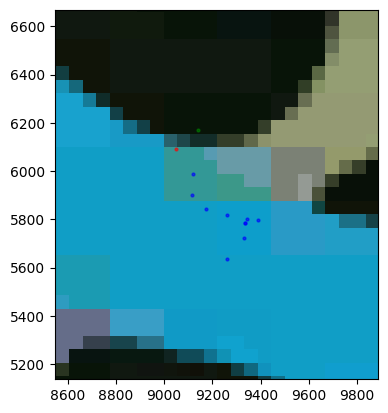

In [35]:
from numpy import single
from utils.compute_zoom_limits import compute_zoom_limits
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def plot_prediction_on_map(points, prediction, truth, map_image_path, zoom_range):
    map_img = mpimg.imread(map_image_path)

    # Display image scaled to the variable
    plt.imshow(map_img, extent=[zoom_range[0][0], zoom_range[0][1], zoom_range[1][0], zoom_range[1][1]])

    # Overlay the player positions on the map
    for player_sequence in points:
        for i in range(1, len(player_sequence), 2):
            plt.plot(player_sequence[i], player_sequence[i-1], 'bo', markersize=2, alpha=0.6)

    for player in prediction:
        plt.plot(player[1], player[0], 'ro', markersize=2, alpha=0.6)

    for player in truth:
        plt.plot(player[1], player[0], 'go', markersize=2, alpha=0.6)

    point_sequence_as_points = np.array([(point_sequence[i-1], point_sequence[i]) for point_sequence in points for i in range(1, len(point_sequence), 2)])

    all_points = np.concatenate((point_sequence_as_points, prediction, truth))
    # Zoom in to the center of the points
    smallest_y = np.min(all_points[:, 0])
    largest_y = np.max(all_points[:, 0])
    smallest_x = np.min(all_points[:, 1])
    largest_x = np.max(all_points[:, 1])
    padding = 500
    print(smallest_x, largest_x, smallest_y, largest_y)
    plt.xlim(smallest_x - padding, largest_x + padding)
    plt.ylim(smallest_y - padding, largest_y + padding)

    plt.show()

map_image_path = "assets/2x_2dlevelminimap.png"

# zoom_range = compute_zoom_limits(all_players_all_games, 0)
# print(zoom_range)
zoom_range = ((75, 14350), (75, 14350)) 

i = slice(0, 1)
plot_prediction_on_map(X_test[i], y_pred[i], y_test[i], map_image_path, zoom_range)

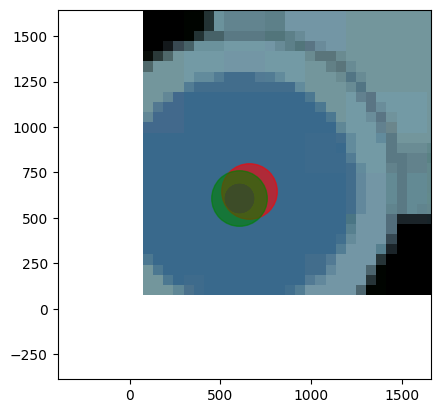

In [54]:
# Show the first 5 predictions in an animation
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def create_prediction_animation(points, prediction, truth, map_image_path, zoom_range):
    fig, ax = plt.subplots()
    map_img = mpimg.imread(map_image_path)
    ax.imshow(map_img, extent=[zoom_range[0][0], zoom_range[0][1], zoom_range[1][0], zoom_range[1][1]])

    def update(frame):
        frame_sequence = points[frame]
        ax.clear()
        ax.imshow(map_img, extent=[zoom_range[0][0], zoom_range[0][1], zoom_range[1][0], zoom_range[1][1]])
        for i in range(1, len(frame_sequence), 2):
            ax.plot(frame_sequence[i], frame_sequence[i-1], 'bo', markersize=20, alpha=0.6)
        ax.plot(prediction[frame][1], prediction[frame][0], 'ro', markersize=40, alpha=0.6)
        ax.plot(truth[frame][1], truth[frame][0], 'go', markersize=40, alpha=0.6)

        point_sequence_as_points = np.array([(frame_sequence[i-1], frame_sequence[i]) for i in range(1, len(frame_sequence), 2)])

        all_points = np.concatenate((point_sequence_as_points, [prediction[frame]], [truth[frame]]))
        furthest_points_x = np.array([all_points[np.argmin(all_points[:, 0])], all_points[np.argmax(all_points[:, 0])]])
        furthest_points_y = np.array([all_points[np.argmin(all_points[:, 1])], all_points[np.argmax(all_points[:, 1])]])
        padding = 1000
        ax.set_xlim(furthest_points_y[0][1] - padding, furthest_points_y[1][1] + padding)
        ax.set_ylim(furthest_points_x[0][0] - padding, furthest_points_x[1][0] + padding)

    # Variable to control animation speed
    speed = 100

    ani = FuncAnimation(fig, update, frames=range(len(X_seq)), interval=speed, blit=False)
    return HTML(ani.to_jshtml())

create_prediction_animation(X_seq, y_pred_seq, y_seq, map_image_path, zoom_range)

